## Business problem

## Import Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import seaborn as sns
sns.set(style='whitegrid')
import warnings 
warnings.filterwarnings('ignore')
import pandas_profiling
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
import xgboost
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import accuracy_score,roc_auc_score,classification_report,confusion_matrix,roc_curve,auc,plot_roc_curve
plt.style.use('ggplot')
#Module related to VIF 
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Moudles related to feature selection
from sklearn.feature_selection import RFE,SelectKBest,f_classif

In [2]:
# Create Data audit Report for continuous variables
def continuous_var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  
                      x.std(), x.var(), x.min(), x.quantile(0.01), x.quantile(0.05),
                          x.quantile(0.10),x.quantile(0.25),x.quantile(0.50),x.quantile(0.75), 
                              x.quantile(0.90),x.quantile(0.95), x.quantile(0.99),x.max()], 
                  index = ['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1', 
                               'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

## Import Data

In [3]:
# Read train data
train=pd.read_csv('E:/DataTrained/Practice_projects/Bank Marketing/train.csv')
train

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribed
0,26110,56,admin.,married,unknown,no,1933,no,no,telephone,19,nov,44,2,-1,0,unknown,no
1,40576,31,unknown,married,secondary,no,3,no,no,cellular,20,jul,91,2,-1,0,unknown,no
2,15320,27,services,married,secondary,no,891,yes,no,cellular,18,jul,240,1,-1,0,unknown,no
3,43962,57,management,divorced,tertiary,no,3287,no,no,cellular,22,jun,867,1,84,3,success,yes
4,29842,31,technician,married,secondary,no,119,yes,no,cellular,4,feb,380,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31642,36483,29,management,single,tertiary,no,0,yes,no,cellular,12,may,116,2,-1,0,unknown,no
31643,40178,53,management,divorced,tertiary,no,380,no,yes,cellular,5,jun,438,2,-1,0,unknown,yes
31644,19710,32,management,single,tertiary,no,312,no,no,cellular,7,aug,37,3,-1,0,unknown,no
31645,38556,57,technician,married,secondary,no,225,yes,no,telephone,15,may,22,7,337,12,failure,no


In [4]:
# Read test data
test=pd.read_csv('E:/DataTrained/Practice_projects/Bank Marketing/test.csv')
test

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,38441,32,services,married,secondary,no,118,yes,no,cellular,15,may,20,6,-1,0,unknown
1,40403,78,retired,divorced,primary,no,2787,no,no,telephone,1,jul,372,1,-1,0,unknown
2,3709,31,self-employed,single,tertiary,no,144,yes,no,unknown,16,may,676,1,-1,0,unknown
3,37422,57,services,single,primary,no,3777,yes,no,telephone,13,may,65,2,-1,0,unknown
4,12527,45,blue-collar,divorced,secondary,no,-705,no,yes,unknown,3,jul,111,1,-1,0,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13559,23465,39,management,married,tertiary,no,45,no,no,cellular,28,aug,148,4,-1,0,unknown
13560,11743,54,blue-collar,married,primary,no,2281,yes,no,unknown,20,jun,158,1,-1,0,unknown
13561,28292,35,retired,married,primary,no,285,yes,no,cellular,29,jan,136,1,-1,0,unknown
13562,45163,29,admin.,single,secondary,no,464,no,no,cellular,9,nov,208,2,91,3,success


## Data Inspection

In [5]:
#profile = pandas_profiling.ProfileReport(train)
#profile.to_widgets()

In [6]:
# train data information 
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31647 entries, 0 to 31646
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   ID          31647 non-null  int64 
 1   age         31647 non-null  int64 
 2   job         31647 non-null  object
 3   marital     31647 non-null  object
 4   education   31647 non-null  object
 5   default     31647 non-null  object
 6   balance     31647 non-null  int64 
 7   housing     31647 non-null  object
 8   loan        31647 non-null  object
 9   contact     31647 non-null  object
 10  day         31647 non-null  int64 
 11  month       31647 non-null  object
 12  duration    31647 non-null  int64 
 13  campaign    31647 non-null  int64 
 14  pdays       31647 non-null  int64 
 15  previous    31647 non-null  int64 
 16  poutcome    31647 non-null  object
 17  subscribed  31647 non-null  object
dtypes: int64(8), object(10)
memory usage: 4.3+ MB


In [7]:
# Check null values in train data
train.isnull().sum()

ID            0
age           0
job           0
marital       0
education     0
default       0
balance       0
housing       0
loan          0
contact       0
day           0
month         0
duration      0
campaign      0
pdays         0
previous      0
poutcome      0
subscribed    0
dtype: int64

###### Train data have no missong values and dtypes are correct.

In [8]:
train.isin(['NAN','NA','N/A','-',' ','?',np.nan]).sum().any()

False

------------------------------------------------------------------------------------------------------------------------------

In [9]:
# Value counts for every feature to check the missing again or unique values
for i in train.columns:
    print(train[i].value_counts())
    print('**********************************')

26110    1
13339    1
39681    1
15135    1
26037    1
        ..
1247     1
15584    1
25376    1
38699    1
14156    1
Name: ID, Length: 31647, dtype: int64
**********************************
32    1457
31    1417
33    1406
34    1321
35    1314
      ... 
92       1
95       1
93       1
94       1
90       1
Name: age, Length: 76, dtype: int64
**********************************
blue-collar      6842
management       6639
technician       5307
admin.           3631
services         2903
retired          1574
self-employed    1123
entrepreneur     1008
unemployed        905
housemaid         874
student           635
unknown           206
Name: job, dtype: int64
**********************************
married     19095
single       8922
divorced     3630
Name: marital, dtype: int64
**********************************
secondary    16224
tertiary      9301
primary       4808
unknown       1314
Name: education, dtype: int64
**********************************
no     31062
yes      585
Name: d

In [10]:
# test data information 
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13564 entries, 0 to 13563
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   ID         13564 non-null  int64 
 1   age        13564 non-null  int64 
 2   job        13564 non-null  object
 3   marital    13564 non-null  object
 4   education  13564 non-null  object
 5   default    13564 non-null  object
 6   balance    13564 non-null  int64 
 7   housing    13564 non-null  object
 8   loan       13564 non-null  object
 9   contact    13564 non-null  object
 10  day        13564 non-null  int64 
 11  month      13564 non-null  object
 12  duration   13564 non-null  int64 
 13  campaign   13564 non-null  int64 
 14  pdays      13564 non-null  int64 
 15  previous   13564 non-null  int64 
 16  poutcome   13564 non-null  object
dtypes: int64(8), object(9)
memory usage: 1.8+ MB


In [11]:
# Check null values in test data
test.isnull().sum()

ID           0
age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
dtype: int64

###### Test data have no missong values and dtypes are correct

In [12]:
# Value counts for every feature to check the missing again or unique values
for i in test.columns:
    print(test[i].value_counts())
    print('**********************************')

38441    1
23664    1
23378    1
18945    1
32574    1
        ..
4606     1
23686    1
35672    1
8550     1
34839    1
Name: ID, Length: 13564, dtype: int64
**********************************
32    628
34    609
35    580
31    579
33    566
     ... 
95      1
86      1
92      1
89      1
90      1
Name: age, Length: 75, dtype: int64
**********************************
blue-collar      2890
management       2819
technician       2290
admin.           1540
services         1251
retired           690
entrepreneur      479
self-employed     456
unemployed        398
housemaid         366
student           303
unknown            82
Name: job, dtype: int64
**********************************
married     8119
single      3868
divorced    1577
Name: marital, dtype: int64
**********************************
secondary    6978
tertiary     4000
primary      2043
unknown       543
Name: education, dtype: int64
**********************************
no     13334
yes      230
Name: default, dtype: int

In [13]:
# Drop ID feature in both train & test data due to high Cardinality 
train.drop('ID',axis=1,inplace=True)
test.drop('ID',axis=1,inplace=True)

In [14]:
# Check duplicates records for train data
train.duplicated().sum()

0

In [15]:
# Check duplicates records for test data
test.duplicated().sum()

0

###### No duplicated reords in both train & test data.

In [16]:
# Handling unknown & -1 values
def missing_value_treat(x):
    if ((x.dtype=='float64') or (x.dtype=='int64')):
        x[x== -1] = np.nan
        x=x.fillna(x.median())
    else:
        x[x=='unknown'] = np.nan
        x=x.fillna(x.mode()[0])
        
    return x    

In [17]:
train=train.apply(missing_value_treat)
test=test.apply(missing_value_treat)

In [18]:
train

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribed
0,56,admin.,married,secondary,no,1933.0,no,no,telephone,19,nov,44,2,193.0,0,failure,no
1,31,blue-collar,married,secondary,no,3.0,no,no,cellular,20,jul,91,2,193.0,0,failure,no
2,27,services,married,secondary,no,891.0,yes,no,cellular,18,jul,240,1,193.0,0,failure,no
3,57,management,divorced,tertiary,no,3287.0,no,no,cellular,22,jun,867,1,84.0,3,success,yes
4,31,technician,married,secondary,no,119.0,yes,no,cellular,4,feb,380,1,193.0,0,failure,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31642,29,management,single,tertiary,no,0.0,yes,no,cellular,12,may,116,2,193.0,0,failure,no
31643,53,management,divorced,tertiary,no,380.0,no,yes,cellular,5,jun,438,2,193.0,0,failure,yes
31644,32,management,single,tertiary,no,312.0,no,no,cellular,7,aug,37,3,193.0,0,failure,no
31645,57,technician,married,secondary,no,225.0,yes,no,telephone,15,may,22,7,337.0,12,failure,no


In [19]:
test.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,32,services,married,secondary,no,118.0,yes,no,cellular,15,may,20,6,195.0,0,failure
1,78,retired,divorced,primary,no,2787.0,no,no,telephone,1,jul,372,1,195.0,0,failure
2,31,self-employed,single,tertiary,no,144.0,yes,no,cellular,16,may,676,1,195.0,0,failure
3,57,services,single,primary,no,3777.0,yes,no,telephone,13,may,65,2,195.0,0,failure
4,45,blue-collar,divorced,secondary,no,-705.0,no,yes,cellular,3,jul,111,1,195.0,0,failure


-------------------------------------------------------------------------------------------------------------------------------

In [20]:
# Check imbalance of the target data
train.subscribed.value_counts(normalize=True)

no     0.882611
yes    0.117389
Name: subscribed, dtype: float64




###### The data is imbalanced

######  Treat the imbalance data later

------------------------------------------------------------------------------------------------------------------------------

------------------------------------------------------------------------------------------------------------------------------

In [21]:
# split train data to continous and categorical varaiables.
num_train=train.select_dtypes(include=['float64','int64'])
cat_train=train.select_dtypes(include=['object'])

In [22]:
# split test data to continous and categorical varaiables.
num_test=test.select_dtypes(include=['float64','int64'])
cat_test=test.select_dtypes(include=['object'])

In [23]:
# Descriptive analysis for continous data
num_train.apply(continuous_var_summary)

,age,balance,day,duration,campaign,pdays,previous
N,3.164700e+04,3.164700e+04,31647.000000,3.164700e+04,31647.000000,3.164700e+04,31647.000000
NMISS,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000
SUM,1.296174e+06,4.317886e+07,501145.000000,8.168519e+06,87526.000000,6.281719e+06,18174.000000
MEAN,4.095725e+01,1.364390e+03,15.835466,2.581135e+02,2.765697,1.984933e+02,0.574272
MEDIAN,3.900000e+01,4.510000e+02,16.000000,1.800000e+02,2.000000,1.930000e+02,0.000000
STD,1.062513e+01,3.028116e+03,8.337097,2.571190e+02,3.113830,5.042350e+01,2.422529
VAR,1.128935e+02,9.169488e+06,69.507182,6.611017e+04,9.695938,2.542529e+03,5.868646
MIN,1.800000e+01,-8.019000e+03,1.000000,0.000000e+00,1.000000,1.000000e+00,0.000000
P1,2.300000e+01,-6.265400e+02,2.000000,1.100000e+01,1.000000,8.100000e+01,0.000000
P5,2.700000e+01,-1.730000e+02,3.000000,3.600000e+01,1.000000,1.480000e+02,0.000000


In [24]:
# Descriptive analysis for test continous data
num_test.apply(continuous_var_summary)

,age,balance,day,duration,campaign,pdays,previous
N,13564.000000,1.356400e+04,13564.000000,1.356400e+04,13564.000000,1.356400e+04,13564.000000
NMISS,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000
SUM,554593.000000,1.843337e+07,213479.000000,3.503292e+06,37430.000000,2.726801e+06,8063.000000
MEAN,40.887128,1.358992e+03,15.738646,2.582787e+02,2.759510,2.010322e+02,0.594441
MEDIAN,39.000000,4.470000e+02,16.000000,1.800000e+02,2.000000,1.950000e+02,0.000000
STD,10.604108,3.082758e+03,8.288174,2.584886e+02,3.060928,5.139538e+01,1.998193
VAR,112.447113,9.503397e+06,68.693836,6.681638e+04,9.369278,2.641485e+03,3.992776
MIN,18.000000,-3.313000e+03,1.000000,0.000000e+00,1.000000,1.000000e+00,0.000000
P1,23.000000,-6.273700e+02,2.000000,1.100000e+01,1.000000,8.463000e+01,0.000000
P5,27.000000,-1.697000e+02,3.000000,3.200000e+01,1.000000,1.481500e+02,0.000000


In [25]:
cat_train.job

0             admin.
1        blue-collar
2           services
3         management
4         technician
            ...     
31642     management
31643     management
31644     management
31645     technician
31646     management
Name: job, Length: 31647, dtype: object

In [26]:
# Descriptive analysis for categorical data
cat_train.describe(include='O')

,job,marital,education,default,housing,loan,contact,month,poutcome,subscribed
count,31647,31647,31647,31647,31647,31647,31647,31647,31647,31647
unique,11,3,3,2,2,2,2,12,3,2
top,blue-collar,married,secondary,no,yes,no,cellular,may,failure,no
freq,7048,19095,17538,31062,17584,26516,29600,9669,29291,27932


In [27]:
# for later EDA 
num_train_eda=num_train.copy()
num_test_eda=num_test.copy()

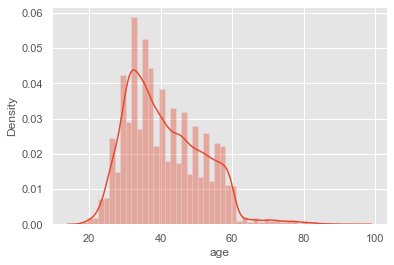

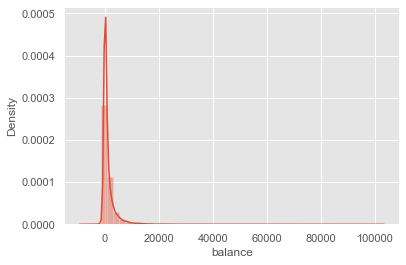

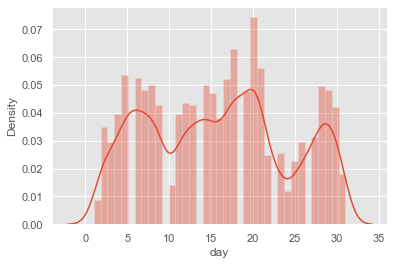

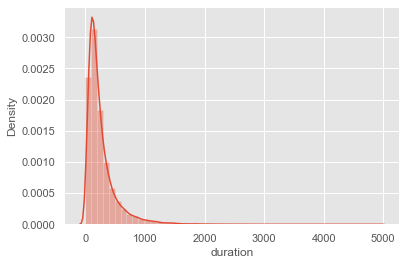

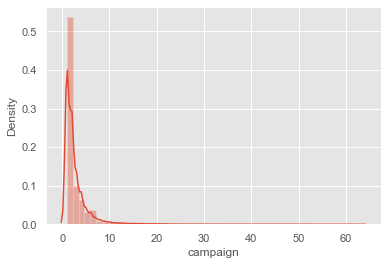

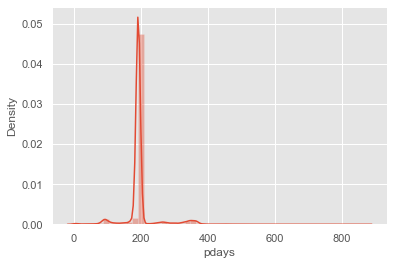

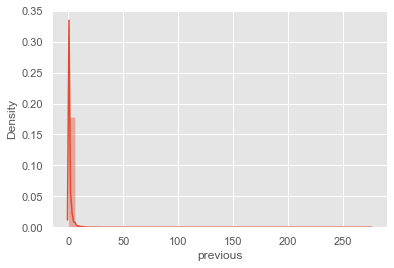

In [28]:
# Check Normality of continous data
for i in num_train.columns:
    sns.distplot(num_train[i])
    plt.show()

######  None of the features are following a normal distribution

-------------------------------------------------------------------------------------------------------------------------------

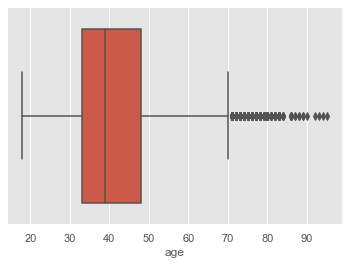

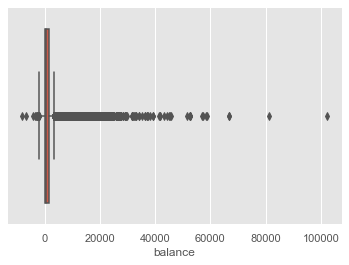

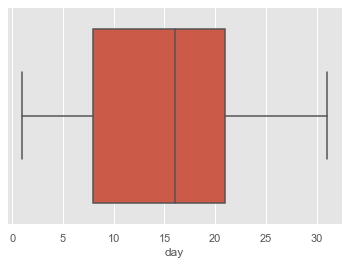

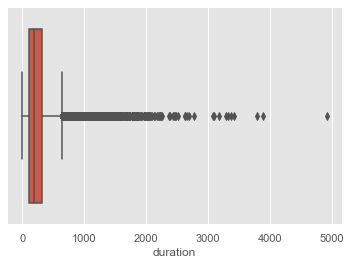

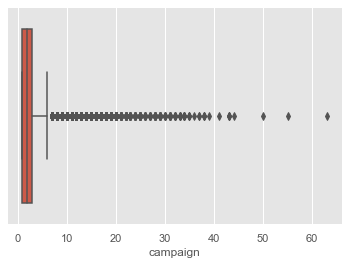

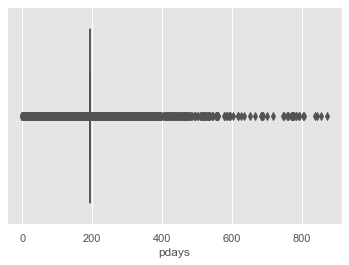

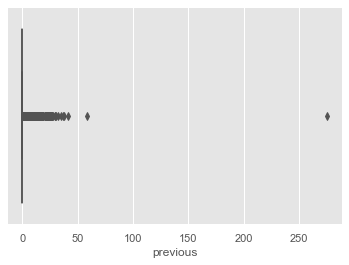

In [29]:
# Check outliers using boxplot
for col in num_train.columns:
    sns.boxplot(num_train[col])
    plt.show()

###### There are alot of outliers

-------------------------------------------------------------------------------------------------------------------------------

In [30]:
# Check skewness
num_train.skew()

age          0.681607
balance      7.996761
day          0.087185
duration     3.199766
campaign     4.873935
pdays        2.932686
previous    49.302348
dtype: float64

In [31]:
# Check skewness
num_test.skew()

age         0.692404
balance     9.166227
day         0.106806
duration    3.017221
campaign    4.958236
pdays       2.903784
previous    8.704583
dtype: float64

##### Features Transformation

In [32]:
def normalize(column):
    upper= column.max()
    lower= column.min()
    y= (column-lower)/(upper-lower)
    return y 

In [33]:
# Keeping +/-0.6 as the range for skewness

# Using Log transformation for num_train data

num_train['age']=np.log(num_train['age'])
num_train['balance']=np.log(num_train['balance']+8020)
num_train['duration']=np.log(num_train['duration']+1)
num_train['campaign']=np.log(num_train['campaign'])
num_train['pdays']=np.log(num_train['pdays'])
num_train['previous']=np.log(num_train['previous']+1)

# Using Log transformation for num_test data

num_test['age']=np.log(num_test['age'])
num_test['balance']=np.log(num_test['balance']+3314)
num_test['duration']=np.log(num_test['duration']+1)
num_test['campaign']=np.log(num_test['campaign'])
num_test['pdays']=np.log(num_test['pdays'])
num_test['previous']=np.log(num_test['previous']+1)

In [34]:
# Check skewness after transformation for both train and test data
print(num_train.skew())
print('****************')
print(num_test.skew())

age         0.100209
balance     0.317422
day         0.087185
duration   -0.438600
campaign    0.887244
pdays      -6.356760
previous    2.537808
dtype: float64
****************
age         0.095850
balance     1.163423
day         0.106806
duration   -0.487798
campaign    0.863909
pdays      -6.378003
previous    2.467240
dtype: float64


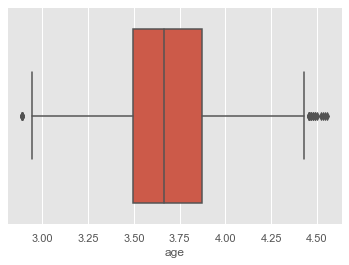

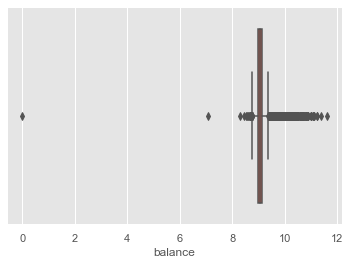

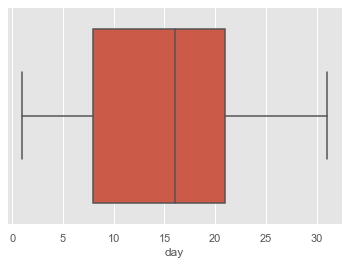

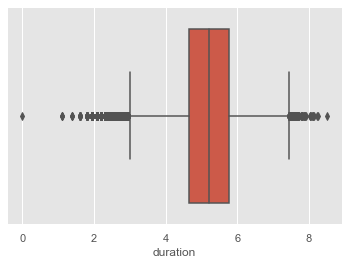

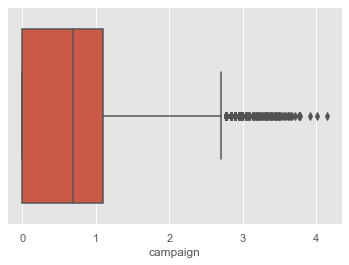

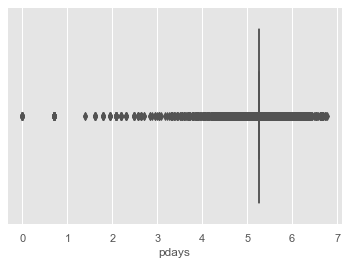

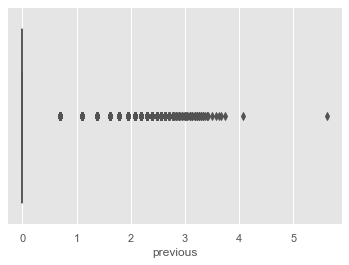

In [35]:
for col in num_train.columns:
    sns.boxplot(num_train[col])
    plt.show()

In [36]:
# Outlier Treatment withing zscore technique of threhold=3
from scipy.stats import zscore
zscore=zscore(num_train[['age','balance','duration','campaign','pdays','previous']])
z=np.abs(zscore)
filtering_entry=(z<3).all(axis=1)
num_train_new= num_train[filtering_entry]
num_train_new.describe()

,age,balance,day,duration,campaign,pdays,previous
count,29490.000000,29490.000000,29490.000000,29490.000000,29490.000000,29490.000000,29490.000000
mean,3.678609,9.099688,15.809122,5.209726,0.683456,5.272989,0.168466
std,0.252564,0.155411,8.315322,0.861402,0.674266,0.191952,0.417464
min,2.944439,8.509564,1.000000,2.484907,0.000000,4.304065,0.000000
25%,3.496508,8.998013,8.000000,4.672829,0.000000,5.262690,0.000000
50%,3.663562,9.041744,16.000000,5.214936,0.693147,5.262690,0.000000
75%,3.871201,9.143132,21.000000,5.774552,1.098612,5.262690,0.000000
max,4.430817,9.763478,31.000000,7.898411,2.833213,6.214608,1.791759


In [37]:
num_train_new

,age,balance,day,duration,campaign,pdays,previous
0,4.025352,9.205629,19,3.806662,0.693147,5.262690,0.000000
1,3.433987,8.990068,20,4.521789,0.693147,5.262690,0.000000
2,3.295837,9.095042,18,5.484797,0.000000,5.262690,0.000000
3,4.043051,9.333177,22,6.766192,0.000000,4.430817,1.386294
4,3.433987,9.004423,4,5.942799,0.000000,5.262690,0.000000
...,...,...,...,...,...,...,...
31641,3.610918,9.140883,6,6.093570,0.693147,5.262690,0.000000
31642,3.367296,8.989694,12,4.762174,0.693147,5.262690,0.000000
31643,3.970292,9.035987,5,6.084499,0.693147,5.262690,0.000000
31644,3.465736,9.027859,7,3.637586,1.098612,5.262690,0.000000


In [38]:
# Data loss  percentage in train data after removing outliers
round(((31647-29490)/31647)*100,2)

6.82

###### Data loss is accepted as it is <7 % of the data

-------------------------------------------------------------------------------------------------------------------------------

## EDA

#### Univariate analysis

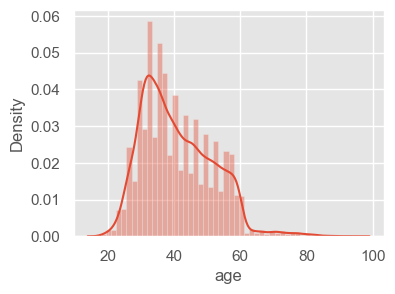

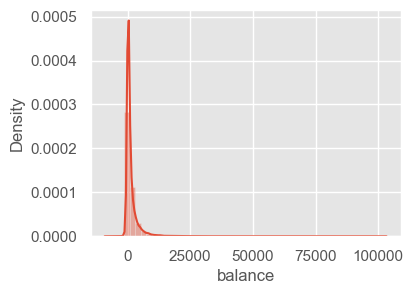

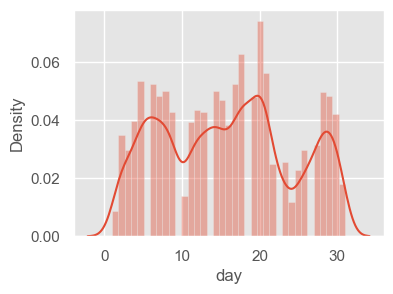

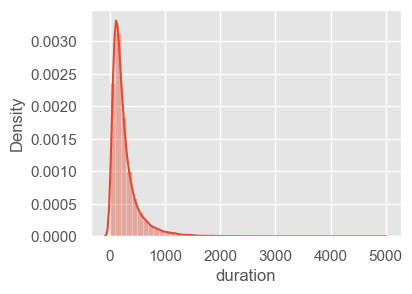

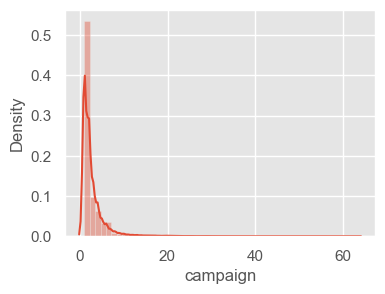

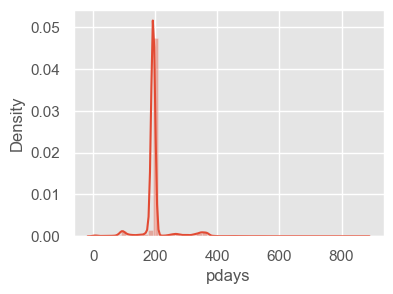

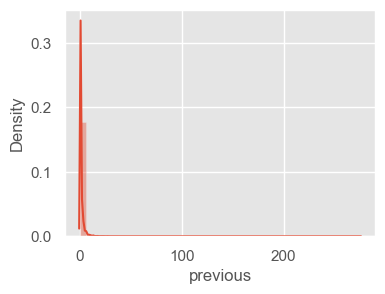

In [39]:
for col in num_train_eda.columns:
    plt.figure(figsize=(4,3),dpi=100)
    sns.distplot(num_train_eda[col])
    plt.show()

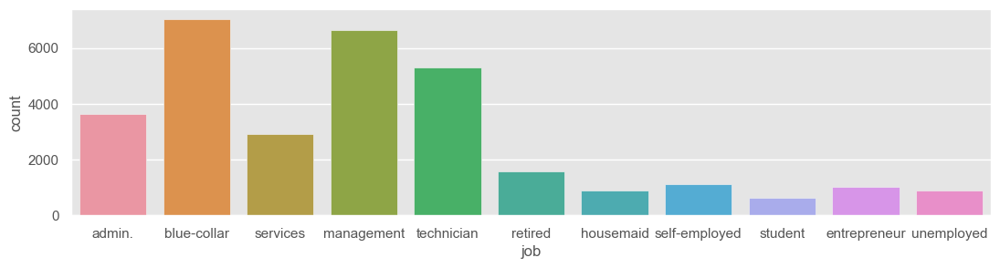

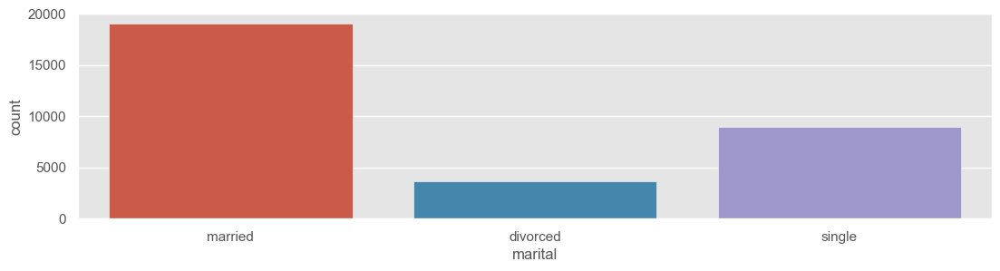

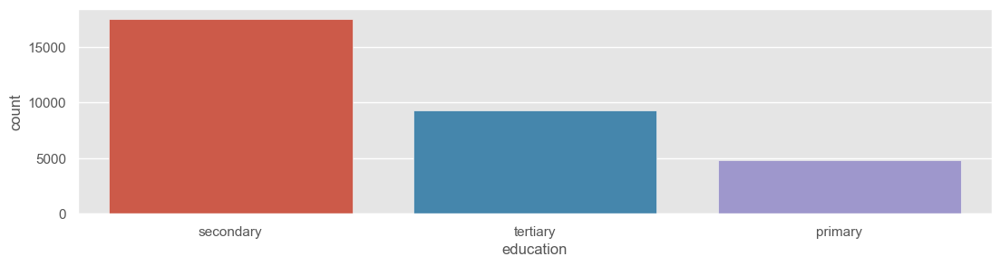

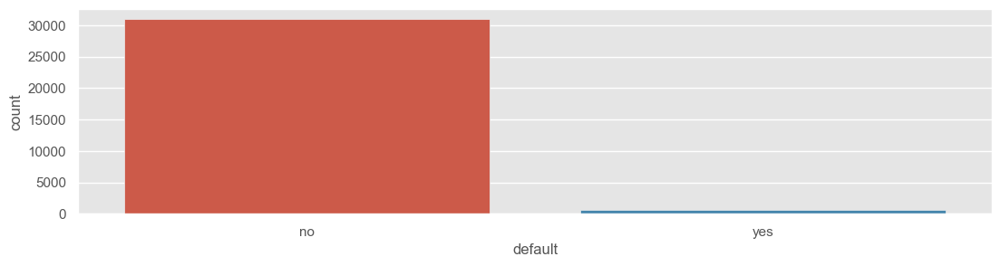

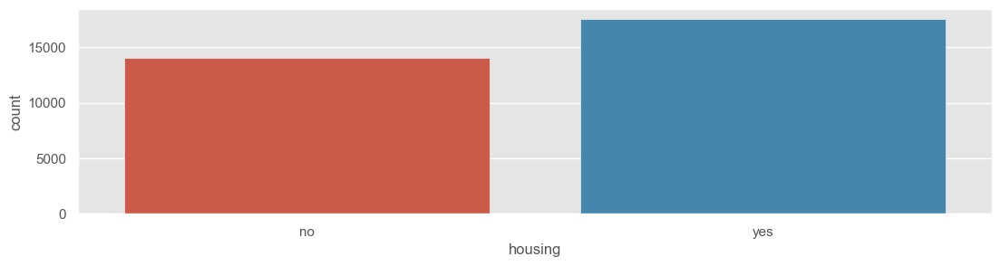

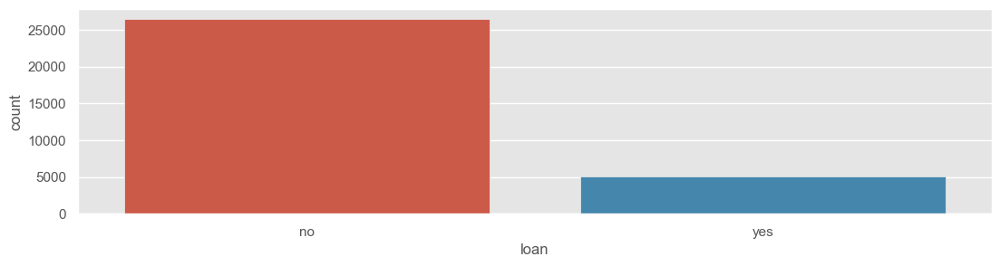

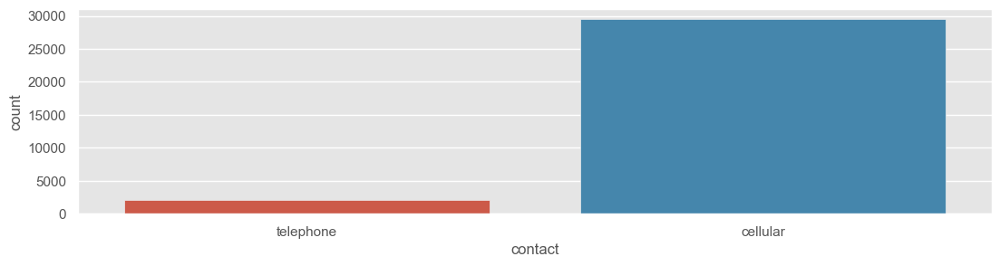

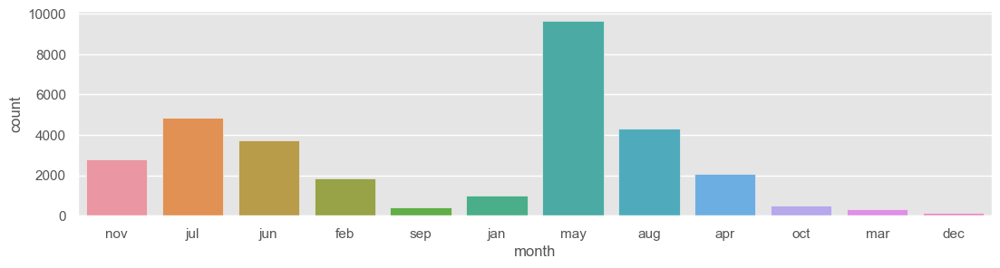

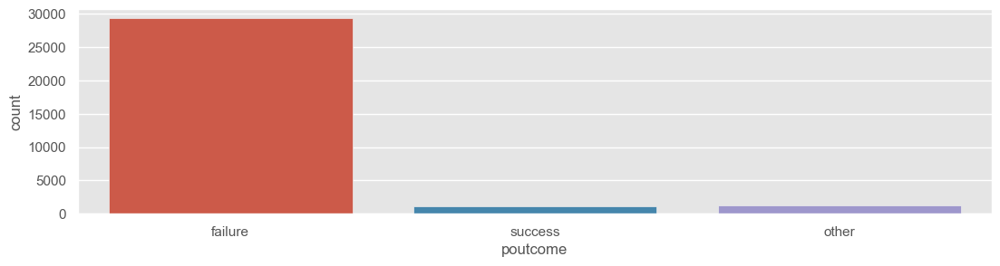

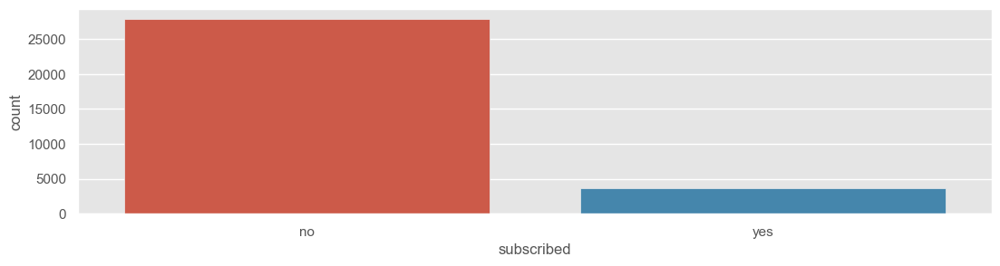

In [40]:
for col in cat_train.columns:
    plt.figure(figsize=(13,3),dpi=100)
    sns.countplot(cat_train[col])
    plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### Bvariate analysis

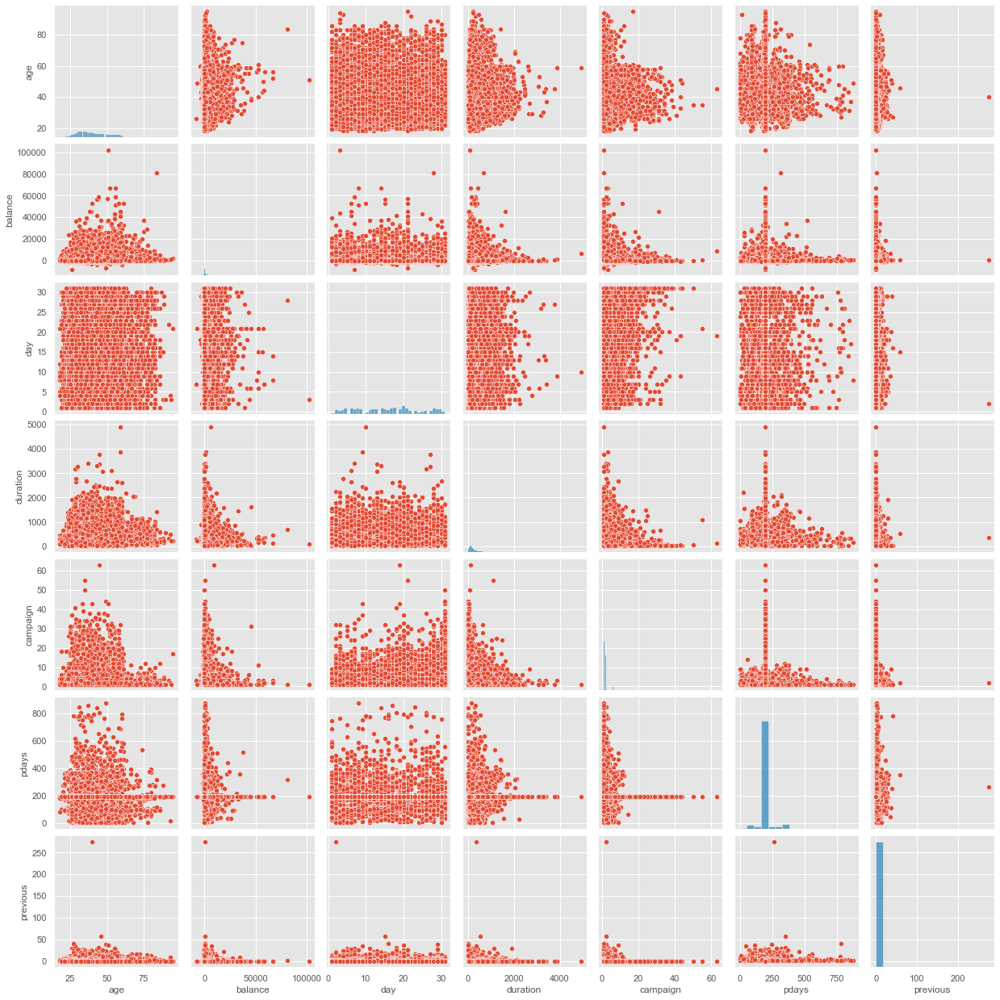

In [41]:
df_eda=pd.concat([num_train_eda,cat_train],axis=1)
sns.pairplot(df_eda)
plt.show()

###### N o much patterns found.

In [42]:
# education/subscribtion
fig=px.histogram(df_eda,x='education',color='subscribed',color_discrete_sequence=['red','grey']
                 ,title='education/subscribtion')
fig.update_layout(bargap=0.1)
fig.show()

In [43]:
# marital/subscribtion
fig=px.histogram(df_eda,x='marital',color='subscribed',color_discrete_sequence=['red','grey']
                 ,title='marital/subscribtion')
fig.update_layout(bargap=0.1)
fig.show()

In [44]:
# marital/housing
fig=px.histogram(df_eda,x='poutcome',color='subscribed',color_discrete_sequence=['red','grey']
                 ,title='poutcome & subscribed')
fig.update_layout(bargap=0.1)
fig.show()

In [45]:
# Fare & Survived
fig=px.scatter(df_eda,x='duration',y='balance',color='subscribed',hover_name='subscribed',opacity=0.8
               ,title='duration vs balnce for subsribed clients')
fig.update_traces(marker_size=5)
fig.show()

-------------------------------------------------------------------------------------------------------------------------------

In [46]:
# Handling Categorical features for train data 

# nominal featre
cat_train=pd.get_dummies(cat_train,columns=cat_train.columns.difference(['education']), drop_first=True)

# ordinal
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
cat_train['education']= le.fit_transform(cat_train['education'])

In [47]:
# View cat_train
cat_train

,education,contact_telephone,default_yes,housing_yes,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,...,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_other,poutcome_success,subscribed_yes
0,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,1,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,1,0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,2,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,1,1
4,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31642,2,0,0,1,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
31643,2,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,1
31644,2,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
31645,1,1,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [48]:
# Handling Categorical features for test data 

# nominal featre
cat_test=pd.get_dummies(cat_test,columns=cat_test.columns.difference(['education']), drop_first=True)

# ordinal
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
cat_test['education']= le.fit_transform(cat_test['education'])

In [49]:
# View cat_test
cat_test

,education,contact_telephone,default_yes,housing_yes,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,...,month_jan,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_other,poutcome_success
0,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,0,1,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0
2,2,0,0,1,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
3,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,1,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13559,2,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
13560,0,0,0,1,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
13561,0,0,0,1,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
13562,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1


-------------------------------------------------------------------------------------------------------------------------------

In [50]:
# final data for training data
train_final=pd.concat([num_train_new,cat_train], axis=1)

In [51]:
# Drop NAN indexes after concatenating
train_final.dropna(inplace=True)

In [52]:
# View final data
train_final

,age,balance,day,duration,campaign,pdays,previous,education,contact_telephone,default_yes,...,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_other,poutcome_success,subscribed_yes
0,4.025352,9.205629,19.0,3.806662,0.693147,5.262690,0.000000,1,1,0,...,0,0,0,0,1,0,0,0,0,0
1,3.433987,8.990068,20.0,4.521789,0.693147,5.262690,0.000000,1,0,0,...,1,0,0,0,0,0,0,0,0,0
2,3.295837,9.095042,18.0,5.484797,0.000000,5.262690,0.000000,1,0,0,...,1,0,0,0,0,0,0,0,0,0
3,4.043051,9.333177,22.0,6.766192,0.000000,4.430817,1.386294,2,0,0,...,0,1,0,0,0,0,0,0,1,1
4,3.433987,9.004423,4.0,5.942799,0.000000,5.262690,0.000000,1,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31641,3.610918,9.140883,6.0,6.093570,0.693147,5.262690,0.000000,2,0,0,...,0,1,0,0,0,0,0,0,0,0
31642,3.367296,8.989694,12.0,4.762174,0.693147,5.262690,0.000000,2,0,0,...,0,0,0,1,0,0,0,0,0,0
31643,3.970292,9.035987,5.0,6.084499,0.693147,5.262690,0.000000,2,0,0,...,0,1,0,0,0,0,0,0,0,1
31644,3.465736,9.027859,7.0,3.637586,1.098612,5.262690,0.000000,2,0,0,...,0,0,0,0,0,0,0,0,0,0


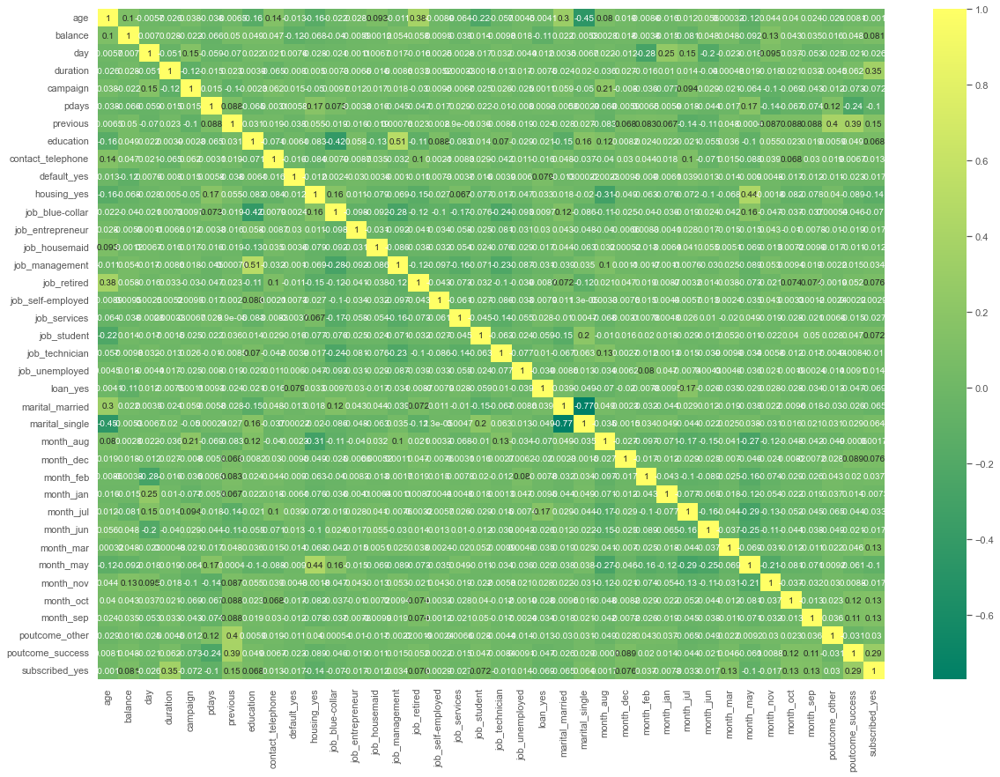

In [53]:
# heatmap correlation
plt.figure(figsize = (20,14))
sns.heatmap(train_final.corr(), annot=True,cmap='summer')
plt.show()

In [54]:
# Drop marital single due to mullti corr() from above heat map

train_final.drop('marital_single',axis=1,inplace=True)

In [55]:
# final data for testing data
test_final=pd.concat([num_test,cat_test],axis=1)

In [56]:
# View final data
test_final

,age,balance,day,duration,campaign,pdays,previous,education,contact_telephone,default_yes,...,month_jan,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_other,poutcome_success
0,3.465736,8.140898,15,3.044522,1.791759,5.273000,0.000000,1,0,0,...,0,0,0,0,1,0,0,0,0,0
1,4.356709,8.716208,1,5.921578,0.000000,5.273000,0.000000,0,1,0,...,0,1,0,0,0,0,0,0,0,0
2,3.433987,8.148446,16,6.517671,0.000000,5.273000,0.000000,2,0,0,...,0,0,0,0,1,0,0,0,0,0
3,4.043051,8.866582,13,4.189655,0.693147,5.273000,0.000000,0,1,0,...,0,0,0,0,1,0,0,0,0,0
4,3.806662,7.866722,3,4.718499,0.000000,5.273000,0.000000,1,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13559,3.663562,8.119399,28,5.003946,1.386294,5.273000,0.000000,2,0,0,...,0,0,0,0,0,0,0,0,0,0
13560,3.988984,8.629629,20,5.068904,0.000000,5.273000,0.000000,0,0,0,...,0,0,1,0,0,0,0,0,0,0
13561,3.555348,8.188411,29,4.919981,0.000000,5.273000,0.000000,0,0,0,...,1,0,0,0,0,0,0,0,0,0
13562,3.367296,8.236950,9,5.342334,0.693147,4.510860,1.386294,1,0,0,...,0,0,0,0,0,1,0,0,0,1


In [166]:
# Drop marital single due to mullti corr() from above heat map

test_final.drop('marital_single',axis=1,inplace=True)

-------------------------------------------------------------------------------------------------------------------------------

### Feature Reduction

##### Weight of evidence & information value

In [57]:
def calculate_woe_iv(dataset, feature, target):
    lst = []
    
    for i in range(dataset[feature].nunique()):
        val = list(dataset[feature].unique())[i]
        lst.append({
            'Value': val,
            'All': dataset[dataset[feature] == val].count()[feature],
            'Good': dataset[(dataset[feature] == val) & (dataset[target] == 0)].count()[feature],
            'Bad': dataset[(dataset[feature] == val) & (dataset[target] == 1)].count()[feature]
        })
        
    dset = pd.DataFrame(lst)
    dset['Distr_Good'] = dset['Good'] / dset['Good'].sum()
    dset['Distr_Bad'] = dset['Bad'] / dset['Bad'].sum()
    dset['WoE'] = np.log(dset['Distr_Good'] / dset['Distr_Bad'])
    dset = dset.replace({'WoE': {np.inf: 0, -np.inf: 0}})
    dset['IV'] = (dset['Distr_Good'] - dset['Distr_Bad']) * dset['WoE']
    iv = dset['IV'].sum()
    
    dset = dset.sort_values(by='WoE')
    
    return dset, iv

In [58]:
for col in train_final.columns:
    if col == 'subscribed_yes': continue
    else:
        print('WoE and IV for column: {}'.format(col))
        df, iv = calculate_woe_iv(train_final, col, 'subscribed_yes')
        print('IV score: {:.2f}'.format(iv))
        print('\n')

WoE and IV for column: age
IV score: 0.21


WoE and IV for column: balance
IV score: 0.70


WoE and IV for column: day
IV score: 0.10


WoE and IV for column: duration
IV score: 1.09


WoE and IV for column: campaign
IV score: 0.06


WoE and IV for column: pdays
IV score: 0.44


WoE and IV for column: previous
IV score: 0.19


WoE and IV for column: education
IV score: 0.05


WoE and IV for column: contact_telephone
IV score: 0.00


WoE and IV for column: default_yes
IV score: 0.00


WoE and IV for column: housing_yes
IV score: 0.19


WoE and IV for column: job_blue-collar
IV score: 0.06


WoE and IV for column: job_entrepreneur
IV score: 0.00


WoE and IV for column: job_housemaid
IV score: 0.00


WoE and IV for column: job_management
IV score: 0.01


WoE and IV for column: job_retired
IV score: 0.04


WoE and IV for column: job_self-employed
IV score: 0.00


WoE and IV for column: job_services
IV score: 0.01


WoE and IV for column: job_student
IV score: 0.04


WoE and IV for column:

In [59]:
l_iv=['age','balance','day','duration','campaign','pdays','previous','education','housing_yes','job_blue-collar','job_retired'
      ,'job_student','loan_yes','marital_married','month_dec','month_mar','month_may','month_oct','month_sep'
      ,'poutcome_success']

-------------------------------------------------------------------------------------------------------------------------------

In [60]:
X = train_final[train_final.columns.difference(['subscribed_yes'])]
y = train_final.subscribed_yes

### RFE

In [61]:
rfe = RFE(RandomForestClassifier(), n_features_to_select=15).fit(X,y)

In [62]:
l2_rfe = X.columns[rfe.get_support()]

In [63]:
l2_rfe

Index(['age', 'balance', 'campaign', 'day', 'duration', 'education',
       'housing_yes', 'job_management', 'job_technician', 'marital_married',
       'month_mar', 'month_oct', 'pdays', 'poutcome_success', 'previous'],
      dtype='object')

### SKB

In [64]:
SKB = SelectKBest(f_classif, k=15).fit(X, y )

In [65]:
l3_skb = X.columns[SKB.get_support()]

In [66]:
l3_skb

Index(['balance', 'campaign', 'duration', 'housing_yes', 'job_blue-collar',
       'job_retired', 'job_student', 'month_dec', 'month_mar', 'month_may',
       'month_oct', 'month_sep', 'pdays', 'poutcome_success', 'previous'],
      dtype='object')

-------------------------------------------------------------------------------------------------------------------------------

In [67]:
list(set((l_iv)+list(l2_rfe)+list(l3_skb)))

['housing_yes',
 'campaign',
 'balance',
 'month_dec',
 'job_blue-collar',
 'education',
 'marital_married',
 'month_mar',
 'month_sep',
 'duration',
 'poutcome_success',
 'age',
 'job_retired',
 'job_management',
 'month_oct',
 'job_technician',
 'pdays',
 'job_student',
 'previous',
 'month_may',
 'loan_yes',
 'day']

In [68]:
Final_list = ['job_blue-collar',
 'housing_yes',
 'month_dec',
 #'pdays',
 'month_sep',
 'job_technician',
 'month_may',
 'previous',
 'loan_yes',
 'job_management',
 'job_retired',
 #'balance',
 'education',
 'job_student',
 'poutcome_success',
 'month_oct',
 'marital_married',
 #'duration',
 #'age',
 'day',
 'campaign',
 'month_mar']

##### VIF check Multicollinarity

In [69]:
X_new = X[Final_list]
y = y

In [70]:
vif = pd.DataFrame()
vif["VIF_Factor"] = [variance_inflation_factor(X_new.values, i) for i in range(X_new.shape[1])]
vif["features"] = X_new.columns

In [71]:
vif.sort_values(by='VIF_Factor', ascending=False, inplace=True)
vif

,VIF_Factor,features
10,4.438535,education
15,3.785896,day
1,2.761638,housing_yes
14,2.341387,marital_married
16,2.037821,campaign
8,2.022024,job_management
5,1.829930,month_may
0,1.632433,job_blue-collar
4,1.468673,job_technician
6,1.392881,previous


-------------------------------------------------------------------------------------------------------------------------------

###  Treat the imblance data

In [73]:
#separating the dependent and independent variable for balancing the class
x=X_new
y=train_final.iloc[:,-1]

In [74]:
# importing smote for balancing the dataset
from imblearn.over_sampling import SMOTE
oversample=SMOTE()
train_x,train_y=oversample.fit_resample(x,y)
len(y),len(train_y)

(29490, 52308)

## ML ALGO.

In [75]:
lr=LogisticRegression()
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(train_x,train_y,random_state=i,test_size=0.25)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    #if (roc_auc_score(pred_train,y_train)*100)==(roc_auc_score(y_test,pred_test)*100):
        #print("At random state ",i," The model performs very well")
    print("At random_state: ",i)
    print("Training roc_auc_score is :",round(roc_auc_score(y_train,pred_train)*100,1))
    print("Testing roc_auc_score is:",round(roc_auc_score(y_test,pred_test)*100,1),  '\n\n')

At random_state:  0
Training roc_auc_score is : 68.8
Testing roc_auc_score is: 68.7 


At random_state:  1
Training roc_auc_score is : 69.0
Testing roc_auc_score is: 68.2 


At random_state:  2
Training roc_auc_score is : 68.8
Testing roc_auc_score is: 69.2 


At random_state:  3
Training roc_auc_score is : 68.8
Testing roc_auc_score is: 68.8 


At random_state:  4
Training roc_auc_score is : 68.7
Testing roc_auc_score is: 69.1 


At random_state:  5
Training roc_auc_score is : 68.8
Testing roc_auc_score is: 69.0 


At random_state:  6
Training roc_auc_score is : 69.0
Testing roc_auc_score is: 68.4 


At random_state:  7
Training roc_auc_score is : 68.9
Testing roc_auc_score is: 68.8 


At random_state:  8
Training roc_auc_score is : 68.9
Testing roc_auc_score is: 69.0 


At random_state:  9
Training roc_auc_score is : 69.0
Testing roc_auc_score is: 68.3 


At random_state:  10
Training roc_auc_score is : 68.8
Testing roc_auc_score is: 68.6 


At random_state:  11
Training roc_auc_scor

At random_state:  94
Training roc_auc_score is : 68.7
Testing roc_auc_score is: 69.0 


At random_state:  95
Training roc_auc_score is : 68.9
Testing roc_auc_score is: 68.7 


At random_state:  96
Training roc_auc_score is : 68.8
Testing roc_auc_score is: 69.0 


At random_state:  97
Training roc_auc_score is : 68.8
Testing roc_auc_score is: 68.7 


At random_state:  98
Training roc_auc_score is : 68.6
Testing roc_auc_score is: 69.4 


At random_state:  99
Training roc_auc_score is : 68.9
Testing roc_auc_score is: 68.9 




#### Split the data

In [76]:
x_train,x_test,y_train,y_test=train_test_split(train_x,train_y,test_size=0.25,random_state=3)

In [77]:
sc=StandardScaler()
x_train_sc=sc.fit_transform(x_train)
x_test_sc=sc.transform(x_test)

### Logistic Regression

In [78]:
lr.fit(x_train_sc,y_train)
pred_train=lr.predict(x_train_sc)
pred_test=lr.predict(x_test_sc)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
score_acc=accuracy_score(y_test,pred_test)
print('Roc_Auc train: ',score_train)
print('Roc_Auc test: ',score_test)
print('Auc test: ',score_acc)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))

Roc_Auc train:  0.688475108997476
Roc_Auc test:  0.6879163308226095
Auc test:  0.6878488950064999
Confusion Matrix:  
 [[4532 2101]
 [1981 4463]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.70      0.68      0.69      6633
           1       0.68      0.69      0.69      6444

    accuracy                           0.69     13077
   macro avg       0.69      0.69      0.69     13077
weighted avg       0.69      0.69      0.69     13077



### cross-validation

In [79]:
for i in range(3,11):
    cvs=cross_val_score(lr,x_train_sc,y_train,cv=i)
    cvs_mean=cvs.mean()
    cvs_std=cvs.std()
    print ("At cv:-",i)
    print ("Cross validation score is :-",cvs_mean*100)
    print ("Cross validation score_std is :-", cvs_std*100)
    print ("Auc Score is :-",score_acc*100)
    print ("\n")

At cv:- 3
Cross validation score is :- 68.82822257908286
Cross validation score_std is :- 0.28272126989864776
Auc Score is :- 68.78488950065


At cv:- 4
Cross validation score is :- 68.83587823916766
Cross validation score_std is :- 0.3026448494939658
Auc Score is :- 68.78488950065


At cv:- 5
Cross validation score is :- 68.75429986979182
Cross validation score_std is :- 0.39498845884729455
Auc Score is :- 68.78488950065


At cv:- 6
Cross validation score is :- 68.81803281073611
Cross validation score_std is :- 0.4089212038848466
Auc Score is :- 68.78488950065


At cv:- 7
Cross validation score is :- 68.77725608253567
Cross validation score_std is :- 0.4205178018019087
Auc Score is :- 68.78488950065


At cv:- 8
Cross validation score is :- 68.77726060533568
Cross validation score_std is :- 0.49339054117989706
Auc Score is :- 68.78488950065


At cv:- 9
Cross validation score is :- 68.81292855140066
Cross validation score_std is :- 0.5853948787514371
Auc Score is :- 68.78488950065


At 

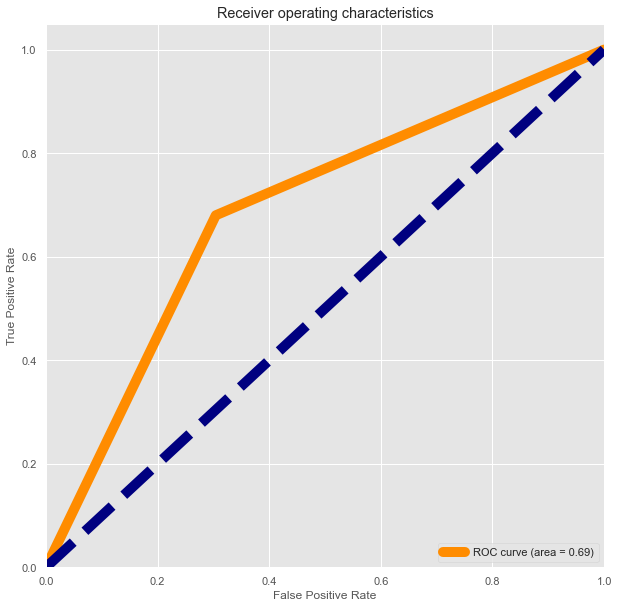

In [80]:
# ROC curve 
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### Decision Tree

In [81]:
dtc=DecisionTreeClassifier()
dtc.fit(x_train_sc,y_train)
pred_train=dtc.predict(x_train_sc)
pred_test=dtc.predict(x_test_sc)
score_train=roc_auc_score(y_train,pred_train)
score_test=roc_auc_score(y_test,pred_test)
print('Roc_Auc Score_train: ',score_train)
print('Roc_Auc Score_test: ',score_test)
print('Confusion Matrix: ' ,'\n','\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(dtc,x,y,cv=3).mean())

Roc_Auc Score_train:  0.9328867120971935
Roc_Auc Score_test:  0.8532662571685334
Confusion Matrix:  
 
 [[5654  979]
 [ 940 5504]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.86      0.85      0.85      6633
           1       0.85      0.85      0.85      6444

    accuracy                           0.85     13077
   macro avg       0.85      0.85      0.85     13077
weighted avg       0.85      0.85      0.85     13077

CV  :  0.8583587656832825


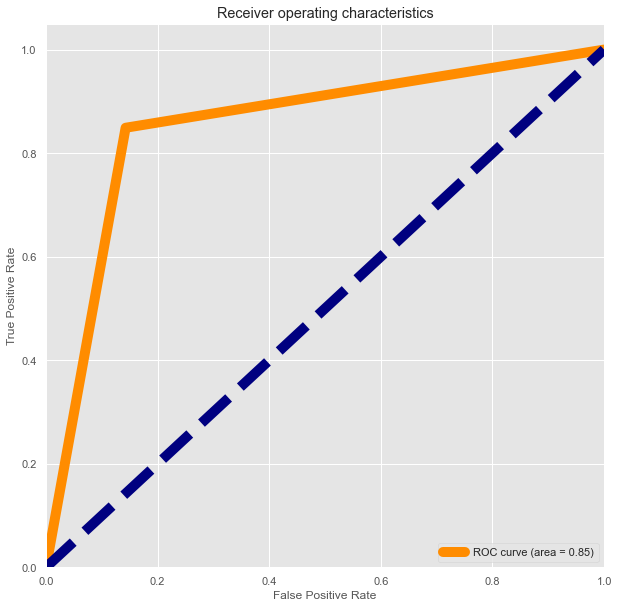

In [82]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

------------------------------------------------------------------------------------------------------------------------------

### SVM

In [83]:
svc= SVC()
svc.fit(x_train_sc,y_train)
pred_train=svc.predict(x_train_sc)
pred_test=svc.predict(x_test_sc)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
print('Roc_Auc train: ',score_train)
print('Roc_Auc test: ',score_test)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(svc,x,y,cv=3).mean())

Roc_Auc train:  0.7116439759640654
Roc_Auc test:  0.702585557063169
Confusion Matrix:  
 [[4530 2103]
 [1790 4654]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.72      0.68      0.70      6633
           1       0.69      0.72      0.71      6444

    accuracy                           0.70     13077
   macro avg       0.70      0.70      0.70     13077
weighted avg       0.70      0.70      0.70     13077

CV  :  0.8870803662258392


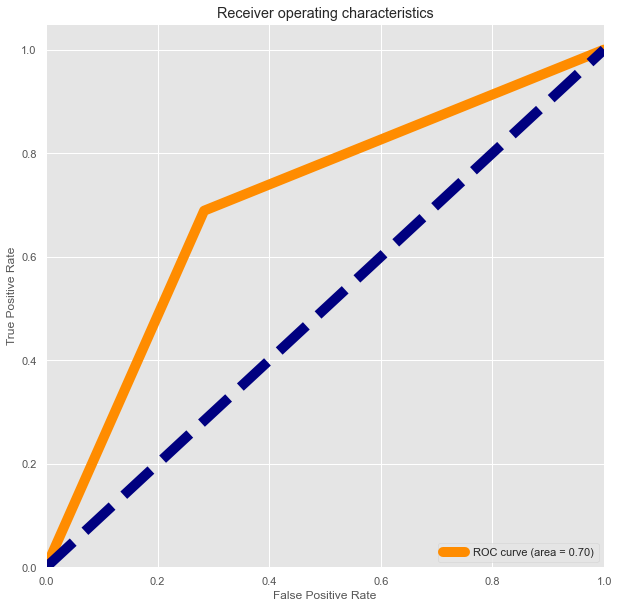

In [84]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

------------------------------------------------------------------------------------------------------------------------------

## Ensembles Techniques

### Random Forest Classifier

In [85]:
rfc= RandomForestClassifier()
rfc.fit(x_train_sc,y_train)
pred_train=rfc.predict(x_train_sc)
pred_test=rfc.predict(x_test_sc)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
print('Roc_Auc train: ',score_train)
print('Roc_Auc test: ',score_test)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(rfc,x,y,cv=3).mean())

Roc_Auc train:  0.9328144330692693
Roc_Auc test:  0.8626484135947989
Confusion Matrix:  
 [[5692  941]
 [ 856 5588]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.87      0.86      0.86      6633
           1       0.86      0.87      0.86      6444

    accuracy                           0.86     13077
   macro avg       0.86      0.86      0.86     13077
weighted avg       0.86      0.86      0.86     13077

CV  :  0.8760596812478806


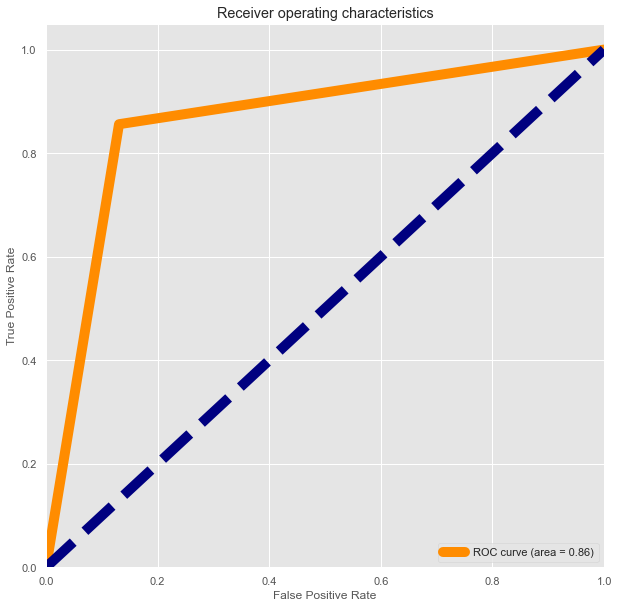

In [86]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### GBC

In [87]:
gbc=GradientBoostingClassifier()
gbc.fit(x_train_sc,y_train)
pred_test=gbc.predict(x_test_sc)
pred_train=gbc.predict(x_train_sc)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
print('Roc_Auc Score: ',score_test)
print('Confusion Matrix: ' ,'\n','\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(gbc,x,y,cv=3).mean())

Roc_Auc Score:  0.8039960389351701
Confusion Matrix:  
 
 [[5724  909]
 [1643 4801]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.78      0.86      0.82      6633
           1       0.84      0.75      0.79      6444

    accuracy                           0.80     13077
   macro avg       0.81      0.80      0.80     13077
weighted avg       0.81      0.80      0.80     13077

CV  :  0.8955239064089522


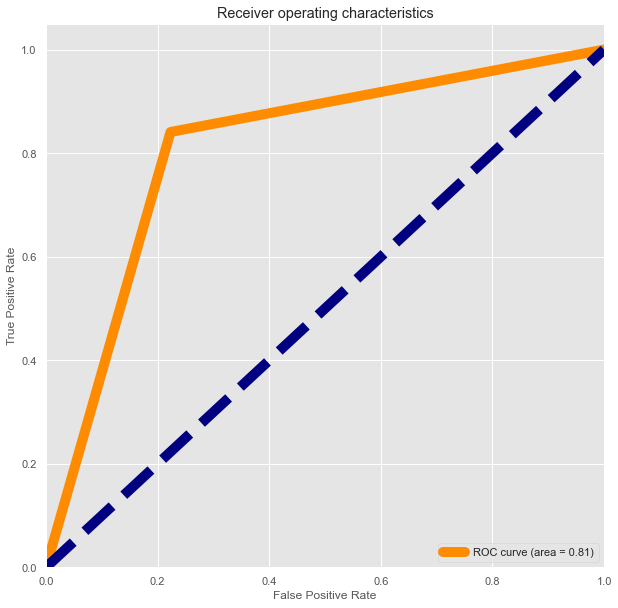

In [88]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### XGBOOST

In [89]:
xgb= XGBClassifier()
xgb.fit(x_train_sc,y_train)
pred_test=xgb.predict(x_test_sc)
pred_train=xgb.predict(x_train_sc)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
print('Roc_Auc Score: ',score_test)
print('Confusion Matrix: ' ,'\n','\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(xgb,x,y,cv=3).mean())

Roc_Auc Score:  0.8576577077369205
Confusion Matrix:  
 
 [[5984  649]
 [1204 5240]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.83      0.90      0.87      6633
           1       0.89      0.81      0.85      6444

    accuracy                           0.86     13077
   macro avg       0.86      0.86      0.86     13077
weighted avg       0.86      0.86      0.86     13077

CV  :  0.8916920990166157


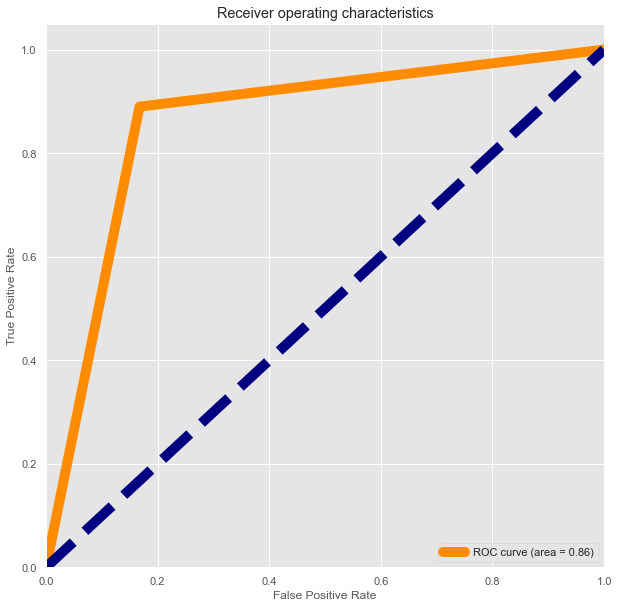

In [90]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

-------------------------------------------------------------------------------------------------------------------------------

-------------------------------------------------------------------------------------------------------------------------------

###### After evaluating different models best one is Random Forest Classifier 

#### Hyperparameter Tuning RF

In [150]:
from sklearn.model_selection import RandomizedSearchCV

In [153]:
rf_param={'n_estimators':[200,500,700,1000],'max_depth':[10,20,25,30],'max_features':['sqrt','auto']
          ,'min_samples_split':[2,5,10],'min_samples_leaf':[1,2,4]}
rf_model = RandomizedSearchCV(RandomForestClassifier(),rf_param,n_iter=100,cv=3,scoring='roc_auc',n_jobs=-1,verbose=2).fit(x_train_sc,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


In [154]:
rf_model.best_params_ 

{'n_estimators': 500,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 25}

In [155]:
rf_model.best_score_                   

0.9291877958069898

In [156]:
rf_model_final = RandomForestClassifier(n_estimators=500, max_depth=25,min_samples_leaf=1,min_samples_split=2
                                        ,max_features= 'sqrt',n_jobs=-1,verbose=2).fit(x_train_sc, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.


building tree 1 of 500
building tree 2 of 500building tree 3 of 500
building tree 4 of 500

building tree 5 of 500
building tree 6 of 500
building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500
building tree 16 of 500
building tree 17 of 500
building tree 18 of 500
building tree 19 of 500
building tree 20 of 500
building tree 21 of 500
building tree 22 of 500
building tree 23 of 500
building tree 24 of 500
building tree 25 of 500
building tree 26 of 500
building tree 27 of 500
building tree 28 of 500
building tree 29 of 500
building tree 30 of 500
building tree 31 of 500
building tree 32 of 500
building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500
building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
b

[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.7s



building tree 44 of 500
building tree 45 of 500
building tree 46 of 500
building tree 47 of 500
building tree 48 of 500
building tree 49 of 500
building tree 50 of 500
building tree 51 of 500
building tree 52 of 500
building tree 53 of 500
building tree 54 of 500
building tree 55 of 500
building tree 56 of 500
building tree 57 of 500
building tree 58 of 500
building tree 59 of 500
building tree 60 of 500
building tree 61 of 500
building tree 62 of 500
building tree 63 of 500
building tree 64 of 500
building tree 65 of 500
building tree 66 of 500
building tree 67 of 500
building tree 68 of 500
building tree 69 of 500
building tree 70 of 500
building tree 71 of 500
building tree 72 of 500
building tree 73 of 500
building tree 74 of 500
building tree 75 of 500
building tree 76 of 500
building tree 77 of 500
building tree 78 of 500
building tree 79 of 500
building tree 80 of 500
building tree 81 of 500
building tree 82 of 500
building tree 83 of 500
building tree 84 of 500
building tree 8

[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:    3.1s


building tree 161 of 500building tree 162 of 500

building tree 163 of 500
building tree 164 of 500
building tree 165 of 500
building tree 166 of 500
building tree 167 of 500
building tree 168 of 500
building tree 169 of 500
building tree 170 of 500
building tree 171 of 500
building tree 172 of 500
building tree 173 of 500
building tree 174 of 500
building tree 175 of 500
building tree 176 of 500
building tree 177 of 500
building tree 178 of 500
building tree 179 of 500
building tree 180 of 500
building tree 181 of 500
building tree 182 of 500
building tree 183 of 500building tree 184 of 500

building tree 185 of 500
building tree 186 of 500
building tree 187 of 500
building tree 188 of 500
building tree 189 of 500
building tree 190 of 500
building tree 191 of 500
building tree 192 of 500
building tree 193 of 500
building tree 194 of 500building tree 195 of 500

building tree 196 of 500
building tree 197 of 500
building tree 198 of 500
building tree 199 of 500
building tree 200 of 500


[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:    7.5s



building tree 368 of 500
building tree 369 of 500
building tree 370 of 500
building tree 371 of 500
building tree 372 of 500
building tree 373 of 500
building tree 374 of 500
building tree 375 of 500building tree 376 of 500

building tree 377 of 500
building tree 378 of 500
building tree 379 of 500
building tree 380 of 500
building tree 381 of 500
building tree 382 of 500building tree 383 of 500
building tree 384 of 500

building tree 385 of 500
building tree 386 of 500
building tree 387 of 500
building tree 388 of 500
building tree 389 of 500
building tree 390 of 500
building tree 391 of 500
building tree 392 of 500
building tree 393 of 500
building tree 394 of 500
building tree 395 of 500
building tree 396 of 500
building tree 397 of 500
building tree 398 of 500
building tree 399 of 500
building tree 400 of 500
building tree 401 of 500
building tree 402 of 500
building tree 403 of 500
building tree 404 of 500
building tree 405 of 500
building tree 406 of 500
building tree 407 of 500

[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:   14.1s finished


In [177]:
xdf=pd.DataFrame(x_train_sc)
xdf

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,-0.459898,1.111765,-0.064791,-0.114194,-0.412428,-0.555493,-0.494898,-0.350673,1.948324,-0.237876,1.290834,-0.150419,-0.282685,-0.140741,-1.082876,0.649123,0.761517,-0.111061
1,2.174394,-0.899471,-0.064791,-0.114194,-0.412428,1.800203,0.987837,-0.350673,-0.513262,-0.237876,-0.244338,-0.150419,-0.282685,-0.140741,0.923467,-0.306962,0.121296,-0.111061
2,-0.459898,1.111765,-0.064791,-0.114194,2.424667,-0.555493,-0.494898,-0.350673,-0.513262,-0.237876,-0.244338,-0.150419,-0.282685,-0.140741,0.923467,0.649123,0.121296,-0.111061
3,-0.459898,1.111765,-0.064791,-0.114194,2.424667,-0.555493,-0.050703,-0.350673,-0.513262,-0.237876,1.290834,-0.150419,-0.282685,-0.140741,-1.082876,-1.240458,0.242306,-0.111061
4,-0.459898,-0.899471,-0.064791,-0.114194,-0.412428,-0.555493,2.593961,-0.350673,1.948324,-0.237876,1.290834,-0.150419,-0.282685,-0.140741,0.923467,1.693825,0.970015,-0.111061
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39226,-0.459898,1.111765,-0.064791,-0.114194,-0.412428,-0.555493,0.987837,-0.350673,-0.513262,-0.237876,-0.244338,6.648083,-0.282685,-0.140741,-1.082876,-1.502068,1.568101,-0.111061
39227,-0.459898,-0.899471,-0.064791,-0.114194,-0.412428,-0.555493,1.715431,-0.350673,-0.513262,-0.237876,-0.244338,-0.150419,3.537506,-0.140741,-1.082876,-1.263047,0.658361,-0.111061
39228,-0.459898,1.111765,-0.064791,-0.114194,-0.412428,-0.555493,2.947907,-0.350673,-0.513262,-0.237876,-0.244338,-0.150419,3.537506,-0.140741,0.923467,0.051570,-0.973170,-0.111061
39229,2.174394,1.111765,-0.064791,-0.114194,-0.412428,1.800203,-0.494898,-0.350673,-0.513262,-0.237876,-0.244338,-0.150419,-0.282685,-0.140741,0.923467,1.246675,0.761517,-0.111061


In [175]:
feats={}
for feature , importance in zip(x_train_sc.columns, model.feature_importances_):
    feats[feature]= importance

AttributeError: 'numpy.ndarray' object has no attribute 'columns'

In [157]:
train_pred = rf_model_final.predict(x_train_sc)
test_pred = rf_model_final.predict(x_test_sc)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    2.1s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    0.8s finished


In [158]:
print('ROC_AUC_Train: ', roc_auc_score(y_train, train_pred))
print('--------------------------------------------------------------------')
print('ROC_AUC_Test: ', roc_auc_score(y_test, test_pred))

ROC_AUC_Train:  0.932585876958639
--------------------------------------------------------------------
ROC_AUC_Test:  0.8641314967401017


In [159]:
# Classification report
print(classification_report(y_test, rf_model_final.predict(x_test_sc)))

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    0.6s


              precision    recall  f1-score   support

           0       0.87      0.86      0.86      6633
           1       0.86      0.87      0.86      6444

    accuracy                           0.86     13077
   macro avg       0.86      0.86      0.86     13077
weighted avg       0.86      0.86      0.86     13077



[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    0.8s finished


In [160]:
print('Confusion Matrix: ' ,'\n','\n',confusion_matrix(y_test,test_pred))
print('CV  : ',cross_val_score(rf_model_final,x,y,cv=3).mean())

Confusion Matrix:  
 
 [[5688  945]
 [ 833 5611]]


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 493 out of 500 | elapsed:    9.3s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:    9.3s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:    4.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 

CV  :  0.8786707358426584


[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    0.5s finished


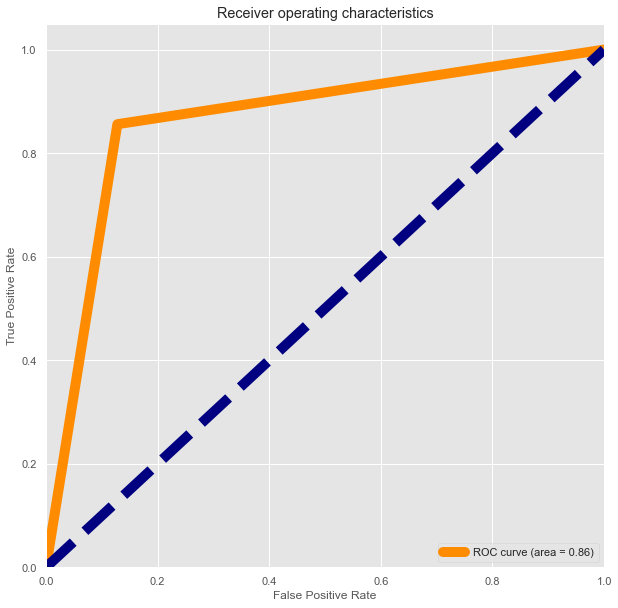

In [161]:
# ROC curve
fpr,tpr,threshold=roc_curve(test_pred,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

------------------------------------------------------------------------------------------------------------------------------

### Save Model

In [162]:
#Saving the model using .pkl
import joblib
joblib.dump(rf_model_final,"Bank.pkl")

['Bank.pkl']

In [163]:
#Loading the saved model
model=joblib.load("Bank.pkl")

In [206]:
# final test data to be used for testing our final Model.
test_final=test_final.loc[:,['education','day','housing_yes','marital_married','campaign','job_management','month_may',
                        'job_blue-collar','job_technician','previous','poutcome_success','loan_yes','job_retired',
                        'job_student','month_oct','month_sep','month_mar','month_dec']]

In [207]:
# Standarized the test file to be ready for predictions

test_final_sc=sc.fit_transform(test_final)

In [209]:
pd.DataFrame(test_final_sc)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,-0.221392,-0.089124,0.893033,0.818932,1.522962,-0.512206,1.520104,-0.529707,-0.450691,-0.430443,-0.183746,-0.429564,-0.231509,-0.151159,-0.130169,-0.112324,-0.100264,-0.064962
1,-1.755861,-1.778340,-1.119779,-1.221103,-0.992527,-0.512206,-0.657850,-0.529707,-0.450691,-0.430443,-0.183746,-0.429564,4.319487,-0.151159,-0.130169,-0.112324,-0.100264,-0.064962
2,1.313078,0.031534,0.893033,-1.221103,-0.992527,-0.512206,1.520104,-0.529707,-0.450691,-0.430443,-0.183746,-0.429564,-0.231509,-0.151159,-0.130169,-0.112324,-0.100264,-0.064962
3,-1.755861,-0.330440,0.893033,-1.221103,-0.019403,-0.512206,1.520104,-0.529707,-0.450691,-0.430443,-0.183746,-0.429564,-0.231509,-0.151159,-0.130169,-0.112324,-0.100264,-0.064962
4,-0.221392,-1.537023,-1.119779,-1.221103,-0.992527,-0.512206,-0.657850,1.887837,-0.450691,-0.430443,-0.183746,2.327941,-0.231509,-0.151159,-0.130169,-0.112324,-0.100264,-0.064962
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13559,1.313078,1.479434,-1.119779,0.818932,0.953721,1.952341,-0.657850,-0.529707,-0.450691,-0.430443,-0.183746,-0.429564,-0.231509,-0.151159,-0.130169,-0.112324,-0.100264,-0.064962
13560,-1.755861,0.514168,0.893033,0.818932,-0.992527,-0.512206,-0.657850,1.887837,-0.450691,-0.430443,-0.183746,-0.429564,-0.231509,-0.151159,-0.130169,-0.112324,-0.100264,-0.064962
13561,-1.755861,1.600092,0.893033,0.818932,-0.992527,-0.512206,-0.657850,-0.529707,-0.450691,-0.430443,-0.183746,-0.429564,4.319487,-0.151159,-0.130169,-0.112324,-0.100264,-0.064962
13562,-0.221392,-0.813073,-1.119779,-1.221103,-0.019403,-0.512206,-0.657850,-0.529707,-0.450691,2.137412,5.442289,-0.429564,-0.231509,-0.151159,-0.130169,-0.112324,-0.100264,-0.064962


In [210]:
#Prediction
prediction = model.predict(test_final_sc)
prediction

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    0.4s finished


array([1, 1, 1, ..., 1, 1, 1], dtype=uint8)

In [214]:
pd.DataFrame(prediction).value_counts()

1    12436
0     1128
dtype: int64